<a href="https://colab.research.google.com/github/juanbautist513/PARTE-PRACTICA-SEGUNDO-PARCIAL/blob/main/Parte_practica_segundo_parcial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Estadistica descriptiva para variables cuantitativas
* Desarrollo parte practica segundo parcial Estadistica
# Integrantes:
* Jhon Davide Peña Romero-2230144
* Javier Mauricio Castellanos Hurtado-2212517
* Carlos Andres Martinez Vergara-2231948
* Juan José Bautista Roldán-2222645




In [ ]:
import seaborn as sns
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt
from scipy.stats import shapiro
import pandas as pd
import io
from google.colab import files
from sklearn.linear_model import LinearRegression
from scipy.stats import spearmanr, kendalltau

In [ ]:
from google.colab import files
import io, pandas as pd, numpy as np
import matplotlib.pyplot as plt, seaborn as sns
from scipy import stats
import statsmodels.api as sm
import statsmodels.formula.api as smf

uploaded = files.upload()
io_csv = io.BytesIO(uploaded['nac2022.csv'])
tabla = pd.read_csv(io_csv, sep=",", index_col=0, encoding='latin-1')
tabla.head(8)

Saving nac2022.csv to nac2022.csv


/tmp/ipython-input-2657479212.py:10: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  tabla = pd.read_csv(io_csv, sep=",", index_col=0, encoding='latin-1')


,COD_MUNIC,AREANAC,SIT_PARTO,OTRO_SIT,SEXO,PESO_NAC,TALLA_NAC,ANO,MES,ATEN_PAR,...,N_HIJOSV,FECHA_NACM,N_EMB,SEG_SOCIAL,IDCLASADMI,EDAD_PADRE,NIV_EDUP,ULTCURPAD,PROFESION,TIPOFORMULARIO
COD_DPTO,,,,,,,,,,,,,,,,,,,,,
8,638,1,1,NaN,1,4,4,2022,12,1,...,2,12/10/2015,2,2,2.0,29,3,8,1.0,1
11,1,1,1,NaN,1,6,5,2022,12,1,...,2,12/09/2012,2,1,1.0,24,4,11,1.0,1
27,1,1,1,NaN,2,6,5,2022,12,1,...,4,14/03/2019,4,2,2.0,25,3,9,1.0,1
8,1,1,1,NaN,1,7,5,2022,12,1,...,2,21/09/2017,4,1,1.0,29,8,2,1.0,1
76,1,1,1,NaN,2,4,4,2022,12,1,...,1,NaN,1,2,2.0,21,2,5,1.0,1
85,250,2,2,NaN,1,6,5,2022,10,5,...,6,22/09/2019,6,2,2.0,19,2,5,5.0,1
76,1,1,1,NaN,1,6,4,2022,12,1,...,1,NaN,1,5,NaN,40,99,99,1.0,1
11,1,1,1,NaN,2,4,4,2022,12,1,...,2,04/01/2016,2,1,1.0,28,5,11,1.0,1


# limpieza de datos
* objetivo: garantizar que las variables con las que vamos a trabajar estén en formato numérico, sin valores perdidos, y con un rango razonable.

In [ ]:
from google.colab import files
import io, pandas as pd, numpy as np
import matplotlib.pyplot as plt, seaborn as sns
from scipy import stats
import statsmodels.api as sm
import statsmodels.formula.api as smf

uploaded = files.upload()
io_csv = io.BytesIO(uploaded['nac2022.csv'])
tabla = pd.read_csv(io_csv, sep=",", index_col=0, encoding='latin-1')
tabla.head(8)

# inspección
print("shape:", tabla.shape)
print("columns:", tabla.columns.tolist())
tabla[['EDAD_PADRE','N_EMB']].info()
# conteos de NA
tabla[['EDAD_PADRE','N_EMB']].isna().sum()
# resumen numérico
tabla[['EDAD_PADRE','N_EMB']].describe(percentiles=[.01,.05,.10,.25,.5,.75,.90,.95,.99]).T

Saving nac2022.csv to nac2022.csv


/tmp/ipython-input-3396699938.py:10: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  tabla = pd.read_csv(io_csv, sep=",", index_col=0, encoding='latin-1')


shape: (573625, 38)
columns: ['COD_MUNIC', 'AREANAC', 'SIT_PARTO', 'OTRO_SIT', 'SEXO', 'PESO_NAC', 'TALLA_NAC', 'ANO', 'MES', 'ATEN_PAR', 'T_GES', 'T_GES_AGRU_CIE', 'NUMCONSUL', 'TIPO_PARTO', 'MUL_PARTO', 'APGAR1', 'APGAR2', 'IDHEMOCLAS', 'IDFACTORRH', 'IDPERTET', 'EDAD_MADRE', 'EST_CIVM', 'NIV_EDUM', 'ULTCURMAD', 'CODPRES', 'CODPTORE', 'CODMUNRE', 'AREA_RES', 'N_HIJOSV', 'FECHA_NACM', 'N_EMB', 'SEG_SOCIAL', 'IDCLASADMI', 'EDAD_PADRE', 'NIV_EDUP', 'ULTCURPAD', 'PROFESION', 'TIPOFORMULARIO']
<class 'pandas.core.frame.DataFrame'>
Index: 573625 entries, 8 to 68
Data columns (total 2 columns):
 #   Column      Non-Null Count   Dtype
---  ------      --------------   -----
 0   EDAD_PADRE  573625 non-null  int64
 1   N_EMB       573625 non-null  int64
dtypes: int64(2)
memory usage: 13.1 MB


,count,mean,std,min,1%,5%,10%,25%,50%,75%,90%,95%,99%,max
EDAD_PADRE,573625.0,36.490922,78.459605,12.0,17.0,20.0,21.0,24.0,29.0,35.0,41.0,45.0,58.0,999.0
N_EMB,573625.0,2.490333,6.148717,1.0,1.0,1.0,1.0,1.0,2.0,3.0,4.0,5.0,8.0,99.0


In [ ]:
#Tabla de selección de variables
tabla_filtro = tabla[['EDAD_PADRE', 'EDAD_MADRE', 'N_HIJOSV','N_EMB']].copy()
tabla_filtro.head()

,EDAD_PADRE,EDAD_MADRE,N_HIJOSV,N_EMB
COD_DPTO,,,,
8,29,3,2,2
11,24,5,2,2
27,25,3,4,4
8,29,4,2,4
76,21,3,1,1


In [ ]:
#Tabla de selección de variables
tabla_filtro = tabla[['EDAD_PADRE', 'EDAD_MADRE', 'N_HIJOSV','N_EMB']].copy()

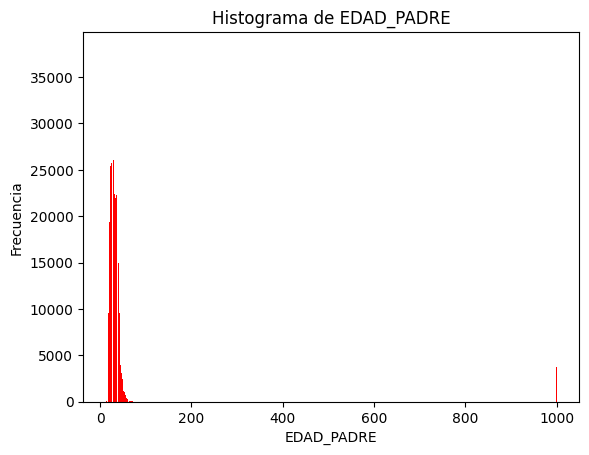

In [ ]:
import matplotlib.pyplot as plot
intervalos = range(min(tabla_filtro.EDAD_PADRE),max(tabla_filtro.EDAD_PADRE)+2) #CON ESTO CALCULAMOS LOS EXTREMOS DE LOS INTERVALOS
plot.hist(x=tabla_filtro.EDAD_PADRE,bins=intervalos,color="#FF0000",rwidth=0.85)
plot.title("Histograma de EDAD_PADRE")
plot.xlabel("EDAD_PADRE")
plot.ylabel("Frecuencia")
plot.show() #Nos da el grafico del histograma

In [ ]:
# Filtrado de datos para eliminar valores atípicos y códigos inválidos
tabla_limpia = tabla_filtro[
    (tabla_filtro['EDAD_PADRE'] < 120) &
    (tabla_filtro['EDAD_MADRE'] < 99) &
    (tabla_filtro['N_HIJOSV'] < 99) &
    (tabla_filtro['N_EMB'] < 99)
].copy()

# Vista preliminar de los primeros registros filtrados
tabla_limpia.head(5)


,EDAD_PADRE,EDAD_MADRE,N_HIJOSV,N_EMB
COD_DPTO,,,,
8,29,3,2,2
11,24,5,2,2
27,25,3,4,4
8,29,4,2,4
76,21,3,1,1


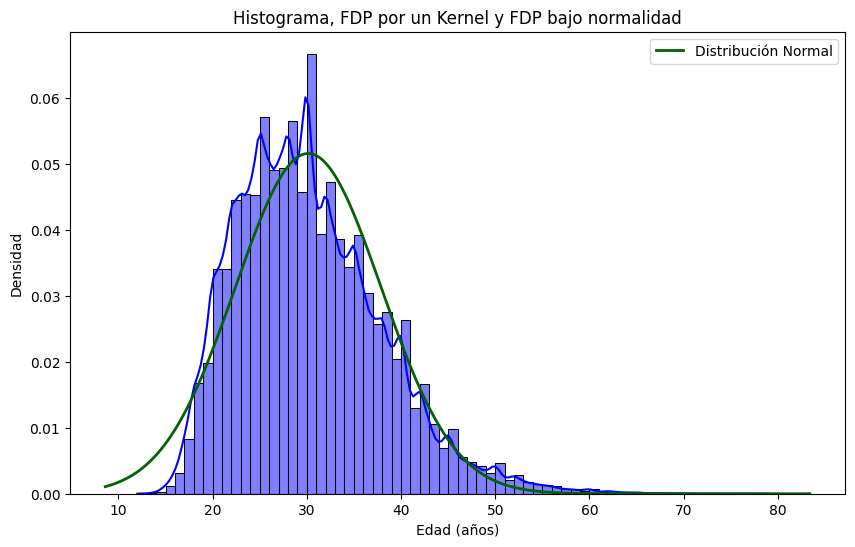

In [ ]:
import seaborn as sns
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt

# Intervalos de los datos
intervalos = range(min(tabla_limpia.EDAD_PADRE), max(tabla_limpia.EDAD_PADRE) + 2)

# Crear figura
plt.figure(figsize=(10,6))

# Histograma con densidad KDE (Kernel Density Estimation)
sns.histplot(
    x=tabla_limpia.EDAD_PADRE,
    bins=intervalos,
    kde=True,
    stat="density",
    color="#0000FF",       # Azul oscuro
    edgecolor="black"      # Borde negro
)

# Curva de distribución normal teórica
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 1000)
p = norm.pdf(x, np.mean(tabla_limpia.EDAD_PADRE), np.std(tabla_limpia.EDAD_PADRE))
plt.plot(x, p, linewidth=2, label="Distribución Normal", color="darkgreen")

# Etiquetas y título
plt.title("Histograma, FDP por un Kernel y FDP bajo normalidad")
plt.xlabel("Edad (años)")
plt.ylabel("Densidad")
plt.legend()

# Mostrar gráfico
plt.show()




Sea $X :=$ la edad del padre de un recién nacido en Colombia.

Al observar el histograma y la función de densidad (línea azul oscuro), se nota que la forma de la distribución no coincide completamente con la curva de una distribución normal teórica (línea verde). Esto indica que los datos reales no siguen un comportamiento normal perfecto.

Si asumimos que $X \sim \text{Normal}(\text{Media} = \bar{x}, \text{Varianza} = S_x^2)$, entonces, dado que la densidad empírica difiere de la normal teórica, no podemos afirmar normalidad. Por lo tanto, el comportamiento de la variable edad del padre se aleja de la suposición de normalidad estadística.


In [ ]:
from scipy.stats import shapiro
shapiro(tabla_limpia.EDAD_PADRE)

/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 568276.
  res = hypotest_fun_out(*samples, **kwds)


ShapiroResult(statistic=np.float64(0.9627148118717348), pvalue=np.float64(1.919587188982723e-116))

* Si el **valor p** en una prueba de hipótesis es menor que 0.05 se rechaza la hipotesis nula con una confianza del 95%
* si el **valor p** en una prueba de hipótesis es mayor que 0.05 no se rechaza la hipotesis nula con una confianza del 95%

En nuestro caso particular, tenemos que pvalue=0.0 < 0.05, es decir , se rechaza que la variable aleatoria de la edad de un padre de un recién nacido en colombia presenta distribución normal.

In [ ]:
tabla_limpia.EDAD_PADRE
len(tabla_limpia.EDAD_PADRE)

568276

In [ ]:
idx = np.random.randint(len(tabla_limpia.EDAD_PADRE), size=100)
shapiro(tabla_limpia.EDAD_PADRE.iloc[idx])

ShapiroResult(statistic=np.float64(0.9734155947379481), pvalue=np.float64(0.04058303699986645))

Formalmente, el valor $p$ obtenido en la prueba de normalidad fue:

$$
p = 1.1961392849572858 \times 10^{-8}
$$
Dado que este valor es menor que $0.05$, se **rechaza la hipótesis nula** de que la variable aleatoria $X$ (edad del padre de un recién nacido en Colombia) sigue una distribución normal.  

En conclusión, **la distribución de la edad de los padres no presenta un comportamiento normal** según la evidencia estadística.

<Axes: xlabel='EDAD_PADRE'>

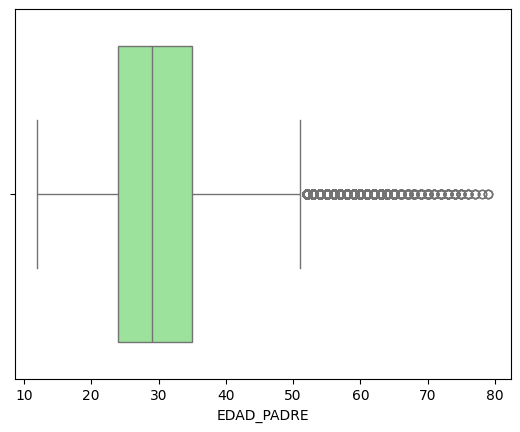

In [ ]:
sns.boxplot(x=tabla_limpia.EDAD_PADRE, color="lightgreen", saturation=0.75)

Del diagrama de caja se evidencia que la **edad de los padres de recién nacidos en Colombia** se concentra principalmente entre los **25 y 35 años**, correspondientes al primer y tercer cuartil, respectivamente. La **media aritmética**, cercana a los **29 años**, sugiere una distribución ligeramente asimétrica hacia la derecha, reflejando la presencia de algunos padres con edades superiores al promedio.  

$\text(Rango intercuartilico = Tercer cuartil - Primer cuartil)=35-25 = 10$

Asimismo, se considera que una **edad paterna atípica** es aquella que **supera los 50 años**, ya que dichos valores se encuentran fuera del rango intercuartílico y representan observaciones infrecuentes dentro de la población analizada.


In [ ]:
import plotly.express as px
plt.figure(figsize=(4,4))
fig = px.strip(tabla_limpia.EDAD_PADRE,orientation="h")
fig.show()


<Figure size 400x400 with 0 Axes>

# Conclusión:
El diagrama de puntos muestra una alta concentración de padres entre los 25 y 40 años, lo que indica que la mayoría de los nacimientos en Colombia se dan dentro de este rango etario.

Se observan pocos casos extremos por debajo de los 20 años y por encima de los 70, lo que sugiere que las edades muy tempranas o avanzadas son atípicas en la población analizada.



In [ ]:
from scipy.stats import skew, kurtosis
print(f"Media: {np.mean(tabla_limpia.EDAD_PADRE)}")
print(f"Varianza: {np.var(tabla_limpia.EDAD_PADRE)} y la desviación estándar: {np.std(tabla_limpia.EDAD_PADRE)}")
print(f"Asimetria: {skew(tabla_limpia.EDAD_PADRE)}")
print(f"Curtosis: {kurtosis(tabla_limpia.EDAD_PADRE)}")


Media: 30.148239587805925
Varianza: 59.92624560757446 y la desviación estándar: 7.741204402906208
Asimetria: 0.7932649439125867
Curtosis: 0.8974620245423521


# Conclusión:
La media de edad de los padres de recién nacidos en Colombia es de aproximadamente 30 años, con una desviación estándar de 7.74, lo que indica una dispersión moderada en torno al promedio. Esto sugiere que la mayoría de los padres se concentran en un rango cercano a esa edad, aunque existen casos que se alejan del promedio.

La asimetría positiva (0.79) evidencia una mayor concentración de edades jóvenesy una ligera extensión hacia edades más avanzadas.
Por su parte, la curtosis (0.89) muestra una distribución levemente más aplanada que la normal, indicando que no hay una presencia marcada de valores extremos.


# Estadistica descriptiva para datos Bivariados
* Diagrama de disperción y la recta de regresión para datos bivariados

Una variable depende de la otra, cuando la ejecución de esta se ve afectada por una variable independiente. Una variable está correlacionada con otra, cuando guardan cierta relación, pero no es posible hablar de dependencia.

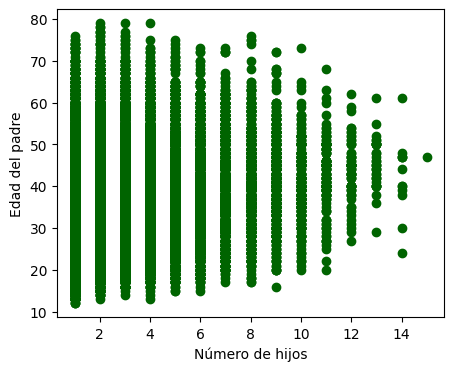

In [ ]:
plt.figure(figsize=(5,4))
plt.scatter(tabla_limpia.N_HIJOSV, tabla_limpia.EDAD_PADRE, color="darkgreen", marker="o")
plt.xlabel('Número de hijos')
plt.ylabel('Edad del padre')
plt.show()

Se observa en el diagrama de disérsión una nube de puntos sin un patrón particular, esto quiere decir que las variables son independientes o no estan correlacionadas. Para nuestro ejemplo quiere decir que el número de hijos y a edad del padre en Colombia no estan correlacionadas (padre joven con muchos hijos o padre mayor con pocos hijos)

In [ ]:
modelo = LinearRegression()
modelo.fit(np.array(tabla_limpia.N_HIJOSV).reshape(-1,1), np.array(tabla_limpia.EDAD_PADRE).reshape(-1,1))
predi_lineal=modelo.predict(np.array(tabla_limpia.N_HIJOSV).reshape(-1,1))
predi_lineal


array([[30.29315726],
       [30.29315726],
       [34.62354964],
       ...,
       [30.29315726],
       [32.45835345],
       [30.29315726]])

NameError: name 'predi_lineal' is not defined

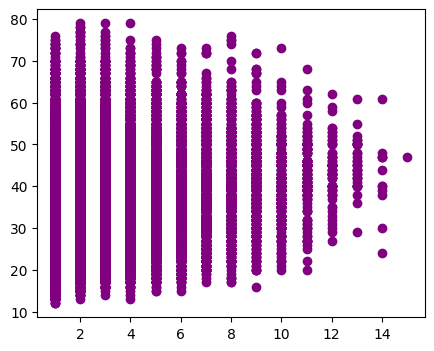

In [ ]:
plt.figure(figsize=(5,4))
plt.scatter(tabla_limpia.N_HIJOSV, tabla_limpia.EDAD_PADRE, color="purple", marker="o")
plt.plot(tabla_limpia.N_HIJOSV, predi_lineal, linestyle='-', color="red")
plt.xlabel('Número de hijos')
plt.ylabel('Edad del padre')
plt.show()


De acuerdo con la recta de regresión se determina una corelación positiva, es decir que entre más hijos tiene un hombre en Colombia, más años tiene esa persona.

*la variable Y depende positivamente de la variable X, es decir, entre mayor valor de X se tenga, mayor será el valor de Y*

In [ ]:
coef_pearson= np.corrcoef(tabla_limpia.N_HIJOSV, tabla_limpia.EDAD_PADRE)
coef_spearman, _= spearmanr(tabla_limpia.N_HIJOSV, tabla_limpia.EDAD_PADRE)
coef_kendall, _= kendalltau(tabla_limpia.N_HIJOSV, tabla_limpia.EDAD_PADRE)
print(f"Coeficiente de correlación de Pearson: {coef_pearson[0,1]}")
print(f"Coeficiente de correlación de Spearman: {coef_spearman}")
print(f"Coeficiente de correlación de Kendall: {coef_kendall}")

Coeficiente de correlación de Pearson: 0.3308429858965031
Coeficiente de correlación de Spearman: 0.3563003702777745
Coeficiente de correlación de Kendall: 0.28081560831586566


Para lla interpretación de los coeficientes de correlación nos ayudaremos de la referencia:

Landis, J., & Koch, G. G. (1977). The measurements of agreement for categorical data Biometrics. Washington, 33(3), 159-179. [Link](https://www.jstor.org/stable/2529310)

* No hay: $\rho (X,Y) = 0, \eta (X,Y) = 0, \kappa (X,Y) = 0$
* Y depende insignificante de X o X y Y están insignificantemente corelacionadas si $0 < \vert \rho (X,Y) \vert < 0.2$, $0 < \vert \eta \rho (X,Y) \vert 0.2$, $0 < \vert \kappa (X,Y) \vert < 0.2$.
* Y depende discretamente de X o X y Y están discretamente corelacionadas si $0.2 < \vert \rho (X,Y) \vert < 0.4$, $0.2 < \vert \eta \rho (X,Y) \vert 0.4$, $0.2 < \vert \kappa (X,Y) \vert < 0.4$.
* Y depende moderadamente de X o X y Y están moderadamente corelacionadas si $0.4 < \vert \rho (X,Y) \vert < 0.6$, $0.4 < \vert \eta \rho (X,Y) \vert 0.6$, $0.4 < \vert \kappa (X,Y) \vert < 0.6$.
* Y depende sustancialmente de X o X y Y están sustancialmente corelacionadas si $0.6 < \vert \rho (X,Y) \vert < 0.8$, $0.6 < \vert \eta \rho (X,Y) \vert 0.8$, $0.6 < \vert \kappa (X,Y) \vert < 0.8$
* Y depende fuertemente de X o X y Y están fuertemente corelacionadas si $0.8 < \vert \rho (X,Y) \vert < 1$, $0.8 < \vert \eta \rho (X,Y) \vert 1$, $0.8 < \vert \kappa (X,Y) \vert < 1$



De acuerdo con los coeficientes de correlación de Pearson, de Kendall y de Spearman se determina que el número de hijos de un padre y la edad de un padre de un recien nacido estan dicretamente correlacionadas.

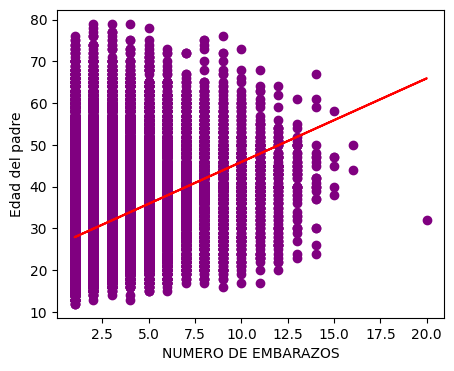

In [ ]:
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import numpy as np
modelo = LinearRegression()
modelo.fit(np.array(tabla_limpia.N_EMB).reshape(-1,1), np.array(tabla_limpia.EDAD_PADRE).reshape(-1,1))
predi_lineal=modelo.predict(np.array(tabla_limpia.N_EMB).reshape(-1,1))

plt.figure(figsize=(5,4))
plt.scatter(tabla_limpia.N_EMB, tabla_limpia.EDAD_PADRE, color="purple", marker="o")
plt.plot(tabla_limpia.N_EMB, predi_lineal, linestyle='-', color="red")
plt.xlabel('NUMERO DE EMBARAZOS')
plt.ylabel('Edad del padre')
plt.show()

* De acuerdo con la recta de regresión se determina una corelación positiva, es decir que entre más hijos tiene un hombre en Colombia, más años tiene esa persona.

*la variable Y depende positivamente de la variable X, es decir, entre mayor valor de X se tenga, mayor será el valor de Y*

* En el diagrama de dispersión se aprecia una distribución de puntos sin una tendencia definida, lo que indica que no existe una relación clara entre las variables. En este caso, significa que la edad del padre y el número de embarazos en Colombia no presentan correlación; es decir, la edad del padre no influye ni permite predecir el número de embarazos.

In [ ]:
from sklearn.linear_model import LinearRegression
modelo = LinearRegression()
modelo.fit(np.array(tabla_limpia.N_EMB).reshape(-1,1), np.array(tabla_limpia.EDAD_PADRE).reshape(-1,1))
predi_lineal=modelo.predict(np.array(tabla_limpia.N_EMB).reshape(-1,1))
predi_lineal

array([[29.9136116 ],
       [29.9136116 ],
       [33.91580864],
       ...,
       [29.9136116 ],
       [31.91471012],
       [29.9136116 ]])

In [ ]:
from scipy.stats import spearmanr, kendalltau

coef_pearson= np.corrcoef(tabla_limpia['N_EMB'], tabla_limpia['EDAD_PADRE'])[0,1]
coef_spearman, _= spearmanr(tabla_limpia['N_EMB'], tabla_limpia['EDAD_PADRE'])
coef_kendall, _= kendalltau(tabla_limpia['N_EMB'], tabla_limpia['EDAD_PADRE'])
print(f"Coeficiente de correlación de Pearson, spearman y kendall son respectivamente {coef_pearson}, {coef_spearman} y {coef_kendall}.")

Coeficiente de correlación de Pearson, spearman y kendall son respectivamente 0.3439947531478934, 0.3709074151898437 y 0.2893019807801233.


Para la interpretación de los coeficientes de correlación nos ayudaremos de la referencia:  

Landis, J. R., & Koch, G. G. (1977). The measurement of observer agreement for categorical data. biometrics, 159-174. [Link](https://www.jstor.org/stable/pdf/2529310.pdf)

* X y Y son independientes o no están correlacionadas: $\rho(X,Y) \approx 0$ ,$\eta(X,Y) \approx 0$ , $\kappa(X,Y) \approx 0$.
* Y depende insignificativamente de X o X y Y están insignificativamente correlacionadas si $0 < \vert \rho(X,Y) \vert < 0.2$ , $0 < \eta(X,Y) < 0.2$ , $0 < \vert \kappa(X,Y) \vert < 0.2$
* Y depende discretamente de X o X y Y están discretamente correlacionadas si $0.2 < \vert \rho(X,Y) \vert < 0.4$ , $0.2 < \eta(X,Y) < 0.4$ , $0.2 < \vert \kappa(X,Y) \vert < 0.4$
* Y depende moderadamente de X o X y Y están moderadamente correlacionadas si $0.4 < \vert \rho(X,Y) \vert < 0.6$ , $0.4 < \eta(X,Y) < 0.6$ , $0.4 < \vert \kappa(X,Y) \vert < 0.6$
*  Y depende sustancialmente de X o X y Y están sustancialmente correlacionadas si $0.6 < \vert \rho(X,Y) \vert < 0.8$ , $0.6 < \eta(X,Y) < 0.8$ , $0.6 < \vert \kappa(X,Y) \vert < 0.8$
*  Y depende moderadamente de X o X y Y están moderadamente correlacionadas si $0.4 < \vert \rho(X,Y) \vert < 0.6$ , $0.4 < \eta(X,Y) < 0.6$ , $0.4 < \vert \kappa(X,Y) \vert < 0.6$


Esto significa que la edad del padre y el número de embarazos en Colombia están débilmente asociadas; es decir, existe una leve tendencia a que, a mayor edad del padre, el número de embarazos aumente ligeramente, aunque esta relación no es significativa y no permite establecer una dependencia fuerte entre ambas variables.